# TP4 Procesamiento en el dominio espacial

## Ejercicio 1. Dada la imagen lena_gray.tif:

### a. Obtenemos el negativo de la imagen.

El negativo de una imagen se define como:

s = L - 1 - r

donde:

- r es el nivel de gris original (0-255 en una imagen de 8 bits).

- L es el número de niveles de gris (256 en este caso).
- s es el nuevo valor de gris del pixel transformado.

El negativo invierte las intensidades generando que los pixeles oscuros se vuelven claros y viceversa.

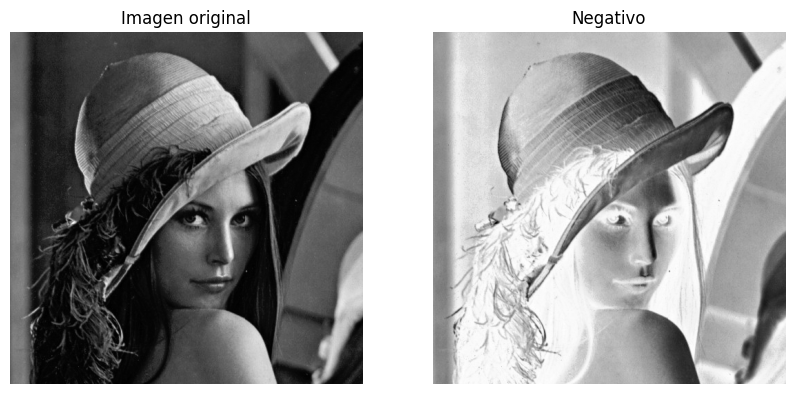

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Leer la imagen en escala de grises
img = cv2.imread("/content/sample_data/lena_gray.tif", cv2.IMREAD_GRAYSCALE)

# Obtener negativo: s = 255 - r
negativo = 255 - img

# Mostrar resultados
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Imagen original")
plt.imshow(img, cmap='gray')
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Negativo")
plt.imshow(negativo, cmap='gray')
plt.axis("off")

plt.show()


### b. Obtenemos una transformación tal que convierta los valores entre [0.25 0.5] al rango [0 1]

En MATLAB, imadjust(I, [low_in high_in], [low_out high_out]) funciona asi:

1. Toma los valores de entrada en un rango [low_in, high_in].

2. Los reescala linealmente al rango [low_out, high_out].

3. Todo lo que quede fuera de ese rango se satura, osea:
    - Menor a low_in → se clipea a low_out.
    - Mayor a high_in → se clipea a high_out.


En python quedaria asi:

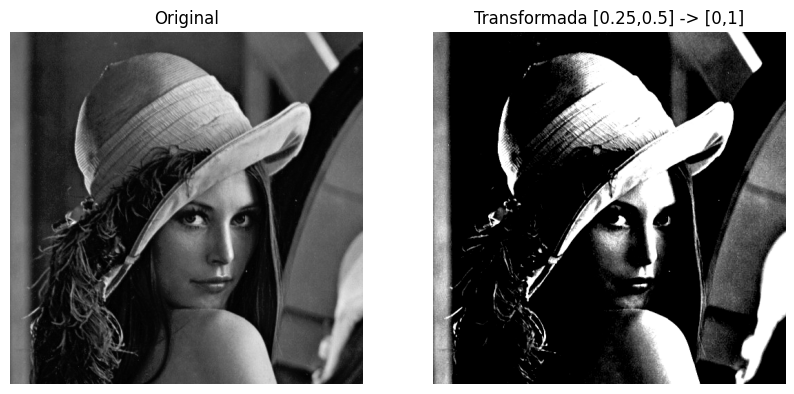

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/lena_gray.tif", cv2.IMREAD_GRAYSCALE)

# Normalizar a [0,1]
img_norm = img / 255.0

# Definir rangos
low_in, high_in = 0.25, 0.5
low_out, high_out = 0.0, 1.0

# Aplicar transformación tipo imadjust
img_adj = np.clip((img_norm - low_in) / (high_in - low_in), 0, 1)

# Convertir de nuevo a 8 bits
img_adj_8bit = (img_adj * 255).astype(np.uint8)

# Mostrar resultados
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(img, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Transformada [0.25,0.5] -> [0,1]")
plt.imshow(img_adj_8bit, cmap="gray")
plt.axis("off")

plt.show()


## Ejercicio 2. Dada la imagen del globo ocular buscamos transformaciones que permitan resaltar las venas lo mejor posible (Imagen eyebw.jpg)

### Contrast stretching:

Buscamos expandir el rango de intensidades donde están las venas (oscuras). Intensidades debajo de m son llevadas a un valor mas oscuro (compresión)
mientras que valores de intensidad mayores a m son llevadas a un valor
mas claro (expansión). En el caso limite tendremos una imagen binaria
(thresholding)



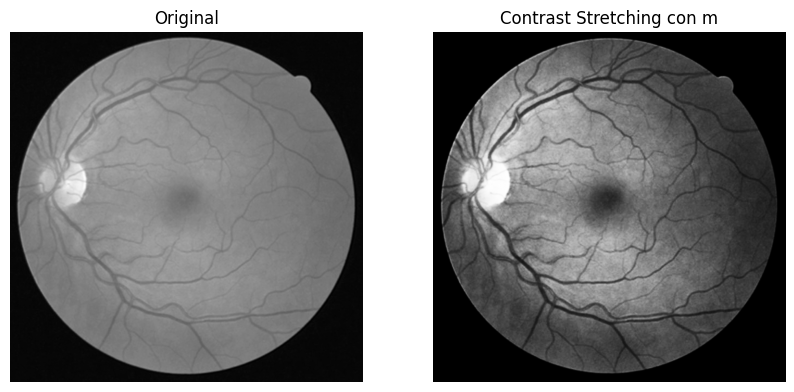

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/eyebw.jpg", cv2.IMREAD_GRAYSCALE)

# Normalizar a [0,1]
img_norm = img / 255.0

# Definir parámetros
m = 0.5      # punto medio
alpha = 15   # controla qué tan fuerte es la pendiente

# Función sigmoide para contrast stretching
contrast_m = 1 / (1 + np.exp(-alpha * (img_norm - m)))

# Convertir de nuevo a 8 bits
contrast_m_8bit = (contrast_m * 255).astype(np.uint8)

# Mostrar resultados
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(img, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Contrast Stretching")
plt.imshow(contrast_m_8bit, cmap="gray")
plt.axis("off")
plt.show()


### Ecualización de histograma
Redistribuye los niveles de gris para usar todo el rango dinámico.

Mejora contraste global por ende las venas se hacen más notorias respecto del fondo



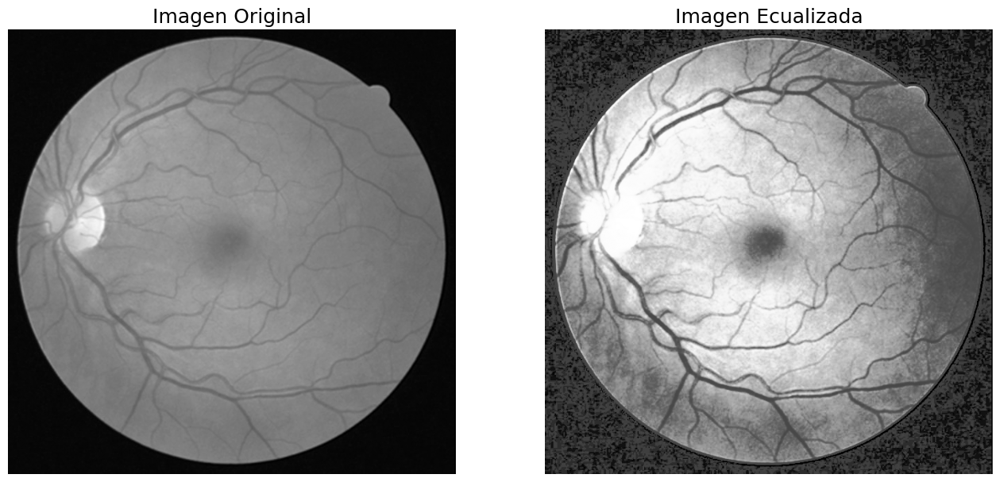

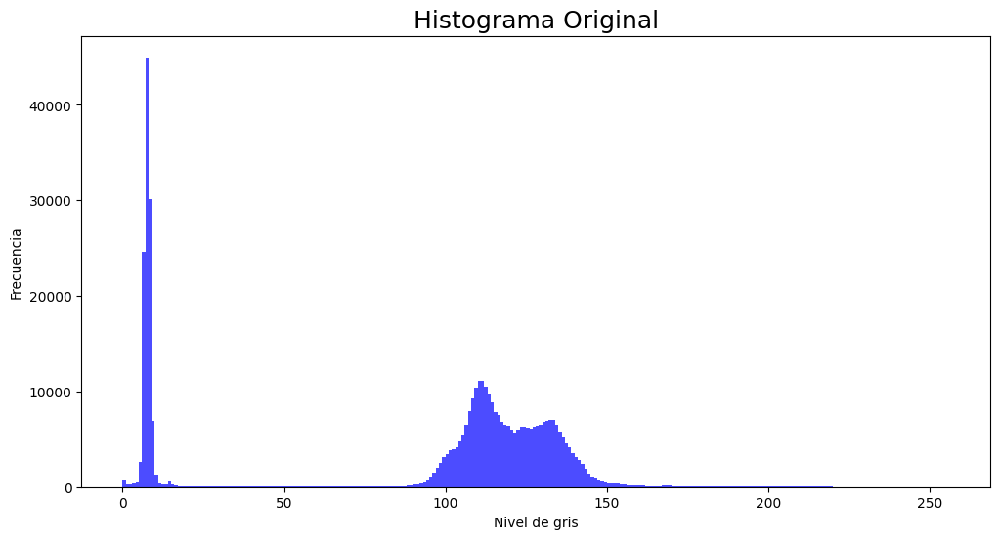

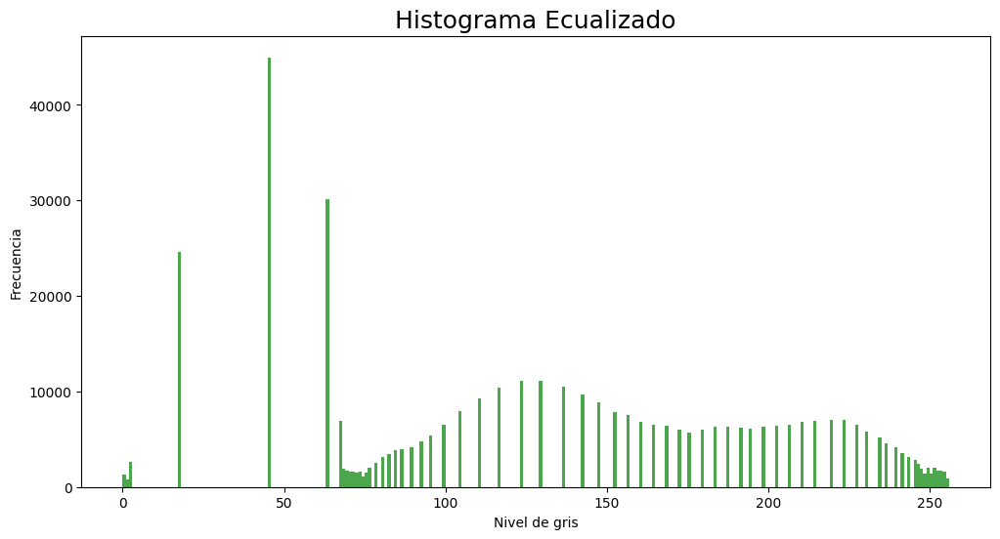

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/eyebw.jpg", cv2.IMREAD_GRAYSCALE)

# Ecualización de histograma
histeq = cv2.equalizeHist(img)

# ============================
# 1) Mostrar imágenes
# ============================
plt.figure(figsize=(16,8))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Imagen Original", fontsize=18)
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(histeq, cmap='gray')
plt.title("Imagen Ecualizada", fontsize=18)
plt.axis("off")

plt.show()

# ============================
# 2) Histograma original
# ============================
plt.figure(figsize=(12,6))
plt.hist(img.ravel(), bins=256, range=(0,256), color='blue', alpha=0.7)
plt.title("Histograma Original", fontsize=18)
plt.xlabel("Nivel de gris")
plt.ylabel("Frecuencia")
plt.show()

# ============================
# 3) Histograma ecualizado
# ============================
plt.figure(figsize=(12,6))
plt.hist(histeq.ravel(), bins=256, range=(0,256), color='green', alpha=0.7)
plt.title("Histograma Ecualizado", fontsize=18)
plt.xlabel("Nivel de gris")
plt.ylabel("Frecuencia")
plt.show()


### CLAHE (Contrast Limited Adaptive Histogram Equalization)

La ecualización de histograma como una forma de mejorar el contraste global de una imagen sin embargo, cuando el contraste entre estructuras como las venas y el fondo es bajo y localizado se puede utilizar CLAHE (Contrast Limited Adaptive Histogram Equalization), que aplica la misma idea de ecualización pero de manera local, dividiendo la imagen en bloques y redistribuyendo los niveles de gris en cada región. Además, limita la amplificación del histograma para evitar que el ruido se resalte demasiado. En síntesis, CLAHE es una extensión práctica de la ecualización de histograma que permite resaltar detalles locales (como las venas del ojo) sin perder la coherencia global de la imagen.


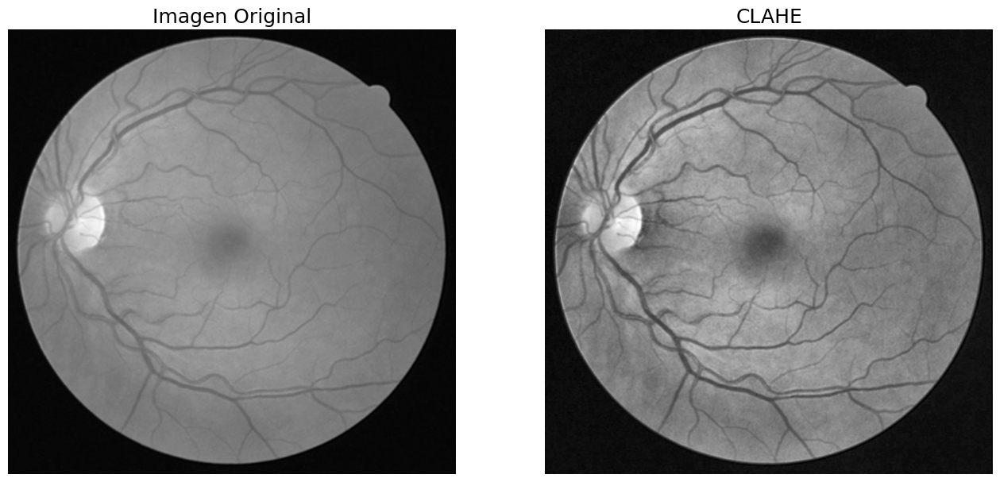

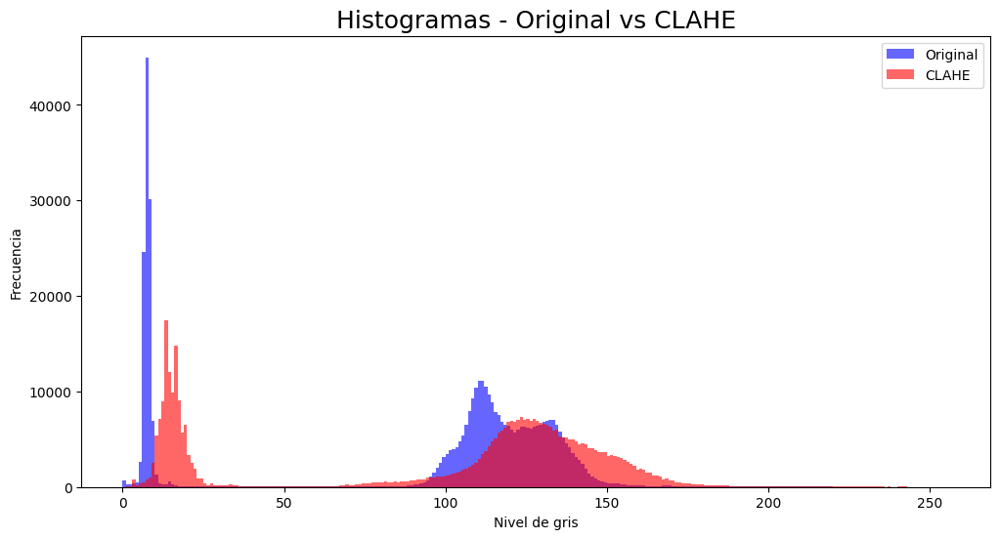

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/eyebw.jpg", cv2.IMREAD_GRAYSCALE)

# Aplicar CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(img)

# Mostrar comparación
plt.figure(figsize=(16,8))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title("Imagen Original", fontsize=18)
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(clahe_img, cmap='gray')
plt.title("CLAHE", fontsize=18)
plt.axis("off")

plt.show()

# Mostrar histograma CLAHE
plt.figure(figsize=(12,6))
plt.hist(img.ravel(), bins=256, range=(0,256), color='blue', alpha=0.6, label="Original")
plt.hist(clahe_img.ravel(), bins=256, range=(0,256), color='red', alpha=0.6, label="CLAHE")
plt.title("Histogramas - Original vs CLAHE", fontsize=18)
plt.xlabel("Nivel de gris")
plt.ylabel("Frecuencia")
plt.legend()
plt.show()


## Ejercicio 3. Bit Plane Slicing

### a. Ejemplo de la teoría

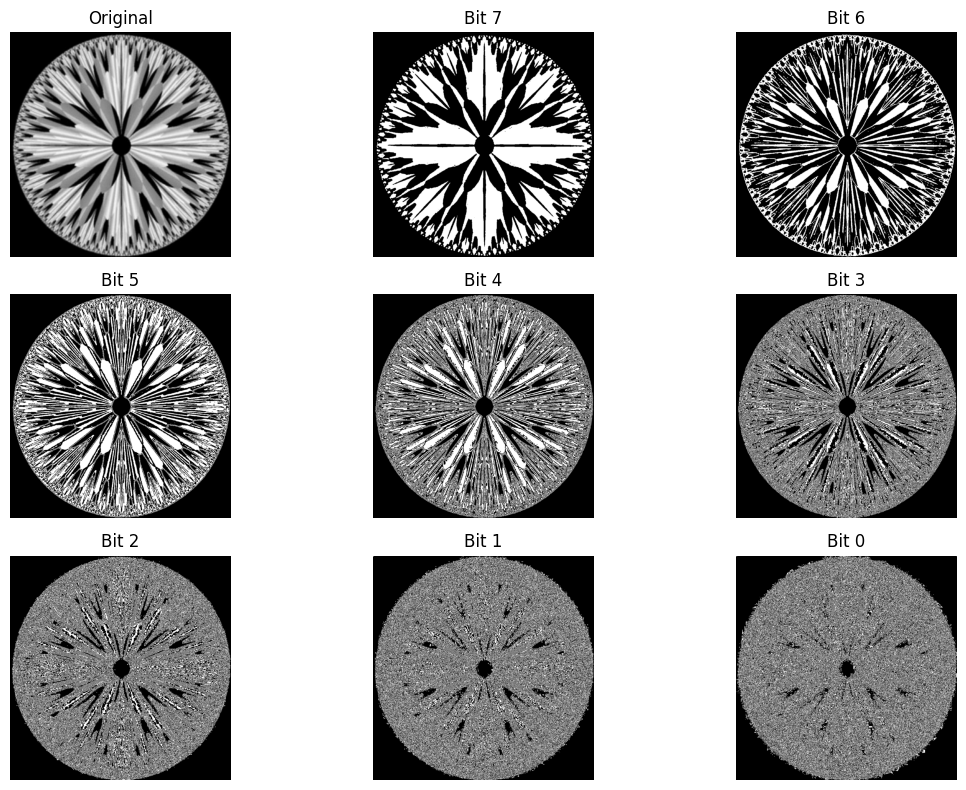

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/ejemploteoricaprocimag.png", cv2.IMREAD_GRAYSCALE)

# Extraer planos de bits
bit_planes = []
for k in range(8):
    plane = ((img >> k) & 1) * 255
    bit_planes.append(plane)

# Mostrar original + 8 planos
plt.figure(figsize=(12,8))

plt.subplot(3,3,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis("off")

for i in range(8):
    plt.subplot(3,3,i+2)
    plt.imshow(bit_planes[7-i], cmap='gray')  # de MSB a LSB
    plt.title(f"Bit {7-i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


### b. Dada la imagen onedollar.jpg la convertimos a niveles de gris y mostramos todos los bit-planes (8 bit). A partir de los bit-planes obtenidos reconstruimos la imagen usando diferentes bit-planes

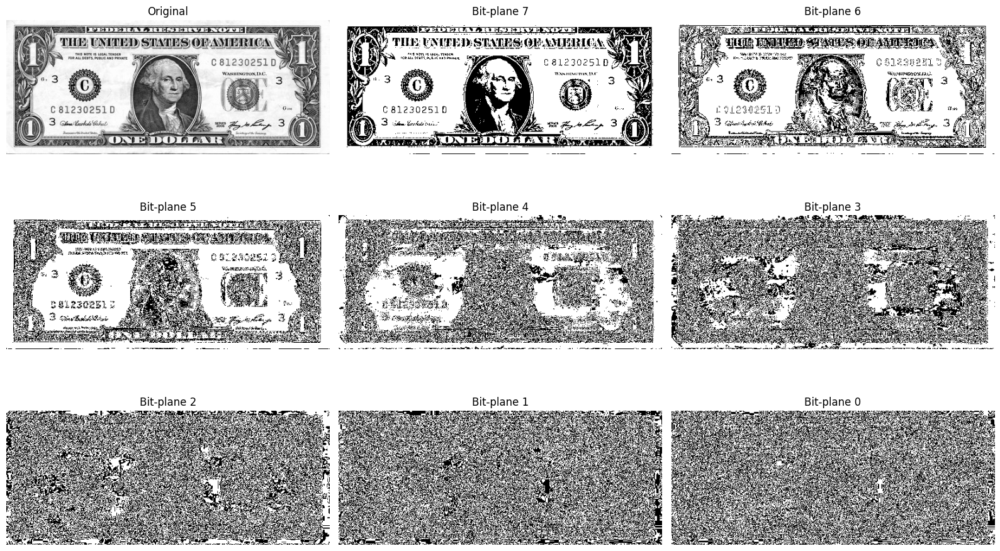

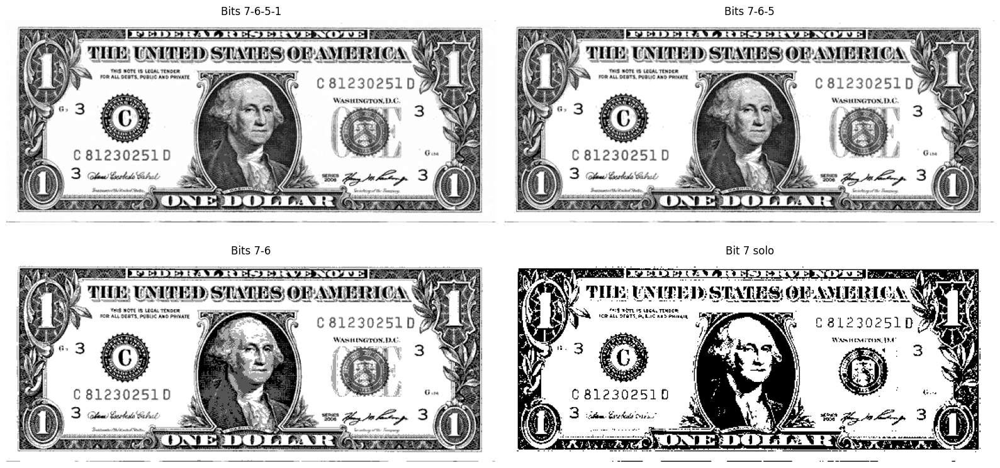

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1) Leer imagen a niveles de gris
img = cv2.imread("/content/sample_data/onedollar.jpg", cv2.IMREAD_GRAYSCALE)

# 2) Extraer planos de bits
bit_planes = []
for k in range(8):
    plane = ((img >> k) & 1) * 255
    bit_planes.append(plane.astype(np.uint8))

# 3) Mostrar original + 8 planos
plt.figure(figsize=(16,10))

plt.subplot(3,3,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis("off")

for i, k in enumerate(range(7,-1,-1), start=2):
    plt.subplot(3,3,i)
    plt.imshow(bit_planes[k], cmap='gray')
    plt.title(f"Bit-plane {k}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# 4) Reconstrucciones parciales
def reconstruct(bits_to_use):
    rec = np.zeros_like(img, dtype=np.uint16)
    for k in bits_to_use:
        rec += ((img >> k) & 1) * (1 << k)
    return np.clip(rec, 0, 255).astype(np.uint8)

rec_7651 = reconstruct([7,6,5,1])
rec_765  = reconstruct([7,6,5])
rec_76   = reconstruct([7,6])
rec_7    = reconstruct([7])

# Mostrar reconstrucciones
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.imshow(rec_7651, cmap='gray')
plt.title("Bits 7-6-5-1")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(rec_765, cmap='gray')
plt.title("Bits 7-6-5")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(rec_76, cmap='gray')
plt.title("Bits 7-6")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(rec_7, cmap='gray')
plt.title("Bit 7 solo")
plt.axis("off")

plt.tight_layout()
plt.show()


## Ejercicio 4. Histograma de una imagen
Un histograma de imagen es una representación estadística que muestra la frecuencia de aparición de los niveles de gris (o colores) en una imagen.

En el eje X los valores posibles de intensidad (0 a 255 en imágenes de 8 bits).

En el eje Y el número de píxeles que tienen ese valor de intensidad.

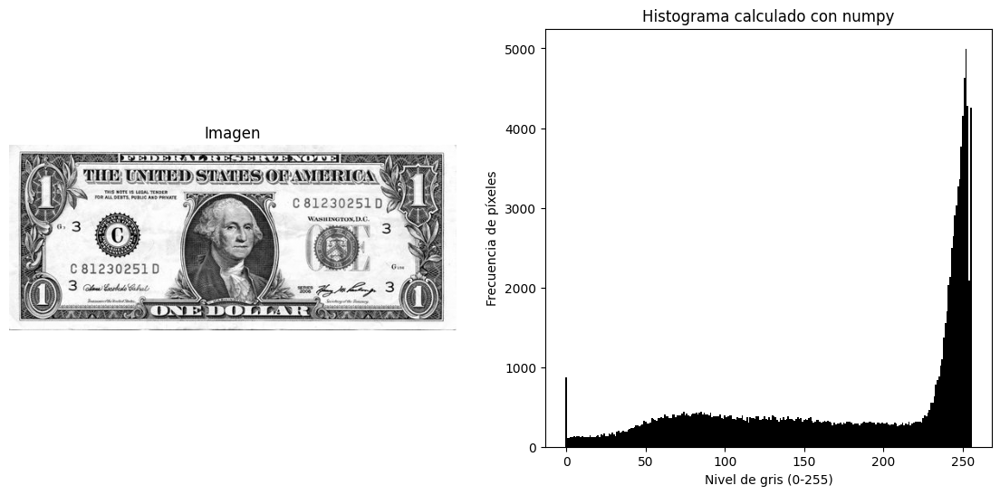

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/onedollar.jpg", cv2.IMREAD_GRAYSCALE)

# Calcular histograma con numpy
# bins=256 -> un bin por cada nivel de gris posible (0-255)
hist, bins = np.histogram(img.flatten(), bins=256, range=[0,256])

# Mostrar imagen y su histograma
plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.imshow(img, cmap="gray")
plt.title("Imagen")
plt.axis("off")

plt.subplot(1,2,2)
plt.bar(bins[:-1], hist, width=1.0, color="black")
plt.title("Histograma calculado con numpy")
plt.xlabel("Nivel de gris (0-255)")
plt.ylabel("Frecuencia de píxeles")

plt.show()


## Ejercicio 5. Explicar que diferencia hay entre el brillo y contraste. Mostrar ejemplos.

El brillo ss la intensidad promedio de todos los píxeles en la imagen. Aumentar el brillo desplazaa todos los valores de gris hacia arriba y por ende la imagen se ve más clara. Disminuir el brillo es desplazar todos los valores hacia abajo y entonces la imagen se ve más oscura.




A diferencia del contraste que es la diferencia entre los valores más oscuros y más claros de la imagen.Aumentar el contraste es expandir las diferencias y genera que lo oscuro se hace más oscuro y lo claro más claro. Mientras que disminuir el contraste comprime la imagen y se ve “plana”.


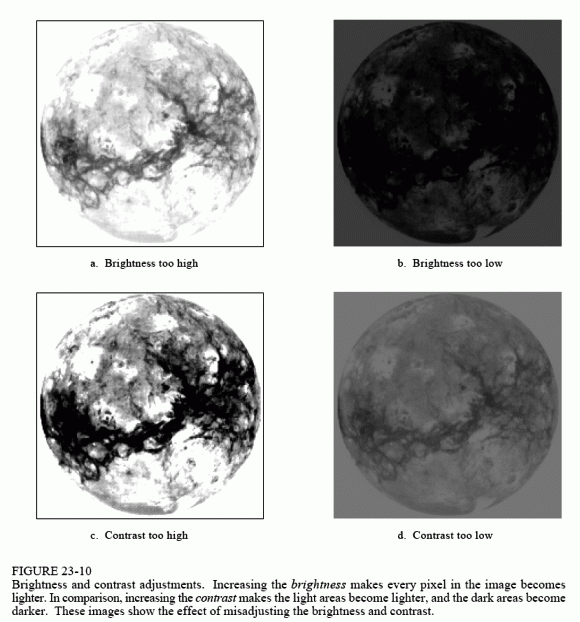

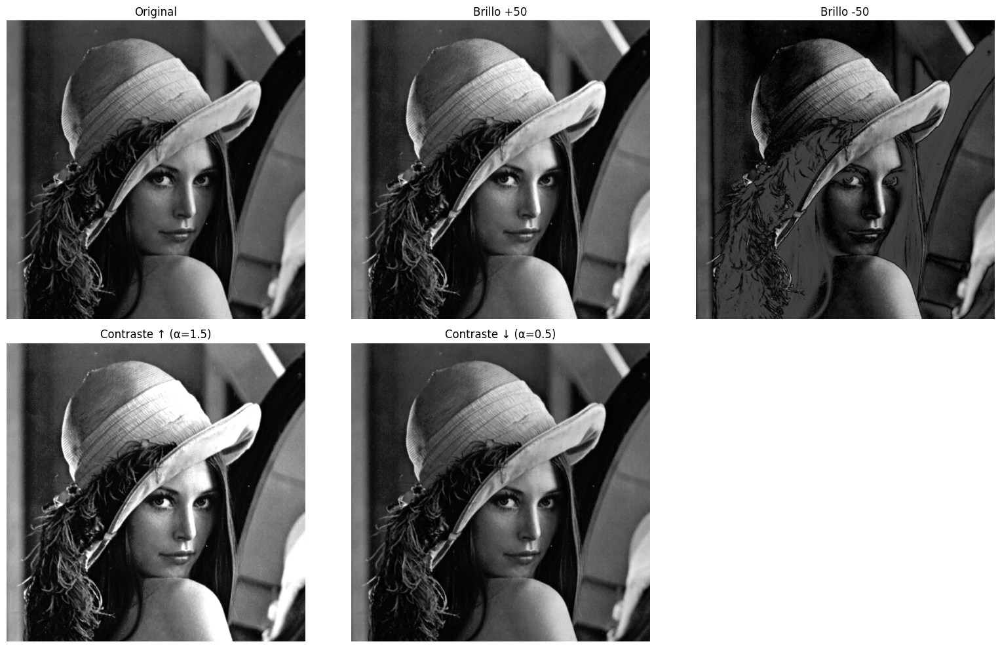

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/lena_gray.tif", cv2.IMREAD_GRAYSCALE)

# Ajustar brillo (+50 y -50)
brighter = cv2.convertScaleAbs(img, alpha=1, beta=50)   # aumenta brillo
darker   = cv2.convertScaleAbs(img, alpha=1, beta=-50)  # reduce brillo

# Ajustar contraste (alpha >1 aumenta, <1 reduce)
high_contrast = cv2.convertScaleAbs(img, alpha=1.5, beta=0)
low_contrast  = cv2.convertScaleAbs(img, alpha=0.5, beta=0)

# Mostrar resultados
plt.figure(figsize=(16,10))

plt.subplot(2,3,1); plt.imshow(img, cmap="gray"); plt.title("Original"); plt.axis("off")
plt.subplot(2,3,2); plt.imshow(brighter, cmap="gray"); plt.title("Brillo +50"); plt.axis("off")
plt.subplot(2,3,3); plt.imshow(darker, cmap="gray"); plt.title("Brillo -50"); plt.axis("off")
plt.subplot(2,3,4); plt.imshow(high_contrast, cmap="gray"); plt.title("Contraste ↑ (α=1.5)"); plt.axis("off")
plt.subplot(2,3,5); plt.imshow(low_contrast, cmap="gray"); plt.title("Contraste ↓ (α=0.5)"); plt.axis("off")

plt.tight_layout()
plt.show()


## Ejercicio 6. Ecualización de un histograma

La ecualización de histograma es una técnica de procesamiento de imágenes que se utiliza para mejorar el contraste. La idea es redistribuir los niveles de intensidad de manera que el histograma de la imagen resultante sea más uniforme. En otras palabras, se “estiran” las intensidades más frecuentes para ocupar un rango más amplio, resaltando así detalles que antes podían quedar ocultos en zonas oscuras o claras.

¿Para qué se usa?

- Mejora de contraste en imágenes médicas: en radiografías o resonancias, permite distinguir estructuras internas que estaban poco diferenciadas.

- Imágenes satelitales: facilita identificar cultivos, agua o suelos al resaltar diferencias de reflectancia en bandas espectrales.

- Fotografía digital: corrige imágenes con mala exposición, donde la mayoría de los píxeles se concentran en un rango reducido (muy oscuros o muy claros).


Ejemplo:

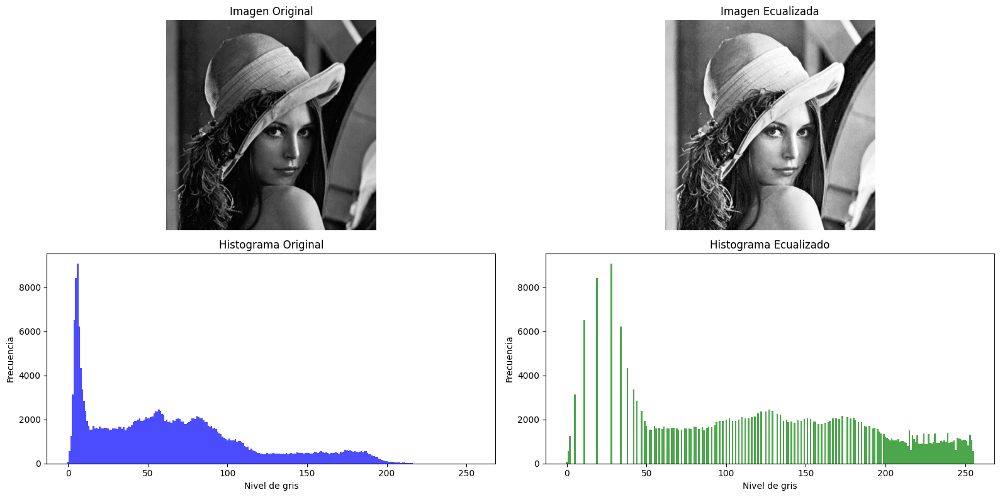

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer imagen en escala de grises
img = cv2.imread("/content/sample_data/lena_gray.tif", cv2.IMREAD_GRAYSCALE)

# Ecualización de histograma
histeq = cv2.equalizeHist(img)

# Histograma original con numpy
hist_orig, bins_orig = np.histogram(img.flatten(), bins=256, range=[0,256])
# Histograma ecualizado
hist_eq, bins_eq = np.histogram(histeq.flatten(), bins=256, range=[0,256])

# ======================
# Mostrar imágenes
# ======================
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.imshow(img, cmap="gray")
plt.title("Imagen Original")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(histeq, cmap="gray")
plt.title("Imagen Ecualizada")
plt.axis("off")

# ======================
# Mostrar histogramas
# ======================
plt.subplot(2,2,3)
plt.bar(bins_orig[:-1], hist_orig, width=1, color="blue", alpha=0.7)
plt.title("Histograma Original")
plt.xlabel("Nivel de gris")
plt.ylabel("Frecuencia")

plt.subplot(2,2,4)
plt.bar(bins_eq[:-1], hist_eq, width=1, color="green", alpha=0.7)
plt.title("Histograma Ecualizado")
plt.xlabel("Nivel de gris")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()


En la figura se observa la imagen original junto con su histograma. Puede apreciarse que la mayoría de los valores de gris se concentran en un rango relativamente reducido, lo que genera un contraste limitado: las zonas oscuras y claras estan mas cercanas.

Al aplicar la ecualización de histograma, los niveles de gris se redistribuyen de manera que el histograma resultante ocupa un rango más amplio y se acerca a una distribución más uniforme. Esto produce un aumento notable en el contraste de la imagen, permitiendo distinguir con mayor claridad los detalles tanto en las áreas oscuras como en las claras.

Este ejemplo muestra cómo la ecualización de histograma es una técnica eficaz para mejorar el contraste global de la imagen, corrigiendo problemas de exposición y resaltando información que en la imagen original podía pasar desapercibida.

## Ejercicio 7. High Dynamic Range (HDR) Imaging

Las cámaras (y las pantallas) tienen un límite: no pueden registrar al mismo tiempo los detalles de zonas muy oscuras y muy claras. En el ejemplo, si se ajusta la cámara a una exposición corta se ve bien lo que está afuera (cielo, árboles), pero el interior queda casi negro. Por otro lado si se ajusta a una exposición larga se ve bien el interior del cuarto, pero la ventana queda blanca.

Esto pasa porque el rango dinámico de la escena (la diferencia entre lo más oscuro y lo más claro) es mucho mayor que el rango que puede capturar la cámara en una sola toma.

HDR (High Dynamic Range) toma varias fotos con distintas exposiciones:

- Fotos "cortas" guardan detalle en zonas brillantes.

- Fotos "largas" guardan detalle en las sombras.

- Fotos "intermedias" completan lo que falta en los tonos medios.

Luego, un algoritmo de fusión HDR combina esas fotos, eligiendo para cada zona la mejor información.

Como resultado se logra

Mostrar el cielo con nubes a la vez que mostrar el interior del cuarto con objetos visibles.

Es decir: detalles en luces y sombras al mismo tiempo.

Se puede pensar  como que con una sola foto hay que elegir qué sacrificar (las luces o las sombras) mientras que con HDR no es necesario sacrificar una al juntar la información de todas las exposiciones.

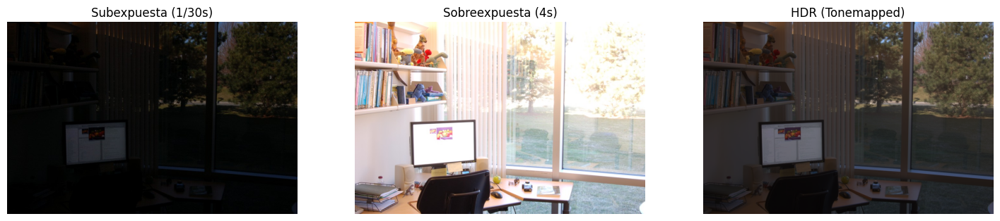

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Archivos de las 6 imágenes
images = [
    cv2.imread("/content/sample_data/office_1.jpg"),
    cv2.imread("/content/sample_data/office_2.jpg"),
    cv2.imread("/content/sample_data/office_3.jpg"),
    cv2.imread("/content/sample_data/office_4.jpg"),
    cv2.imread("/content/sample_data/office_5.jpg"),
    cv2.imread("/content/sample_data/office_6.jpg"),
]
# Tiempos de exposición (segundos)
exposure_times = np.array([0.0333, 0.1000, 0.3333, 0.6250, 1.3000, 4.0000], dtype=np.float32)

# --- Paso 1: Calibrar respuesta de cámara
calibrate = cv2.createCalibrateDebevec()
responseDebevec = calibrate.process(images, exposure_times)

# --- Paso 2: Crear imagen HDR (en float32)
merge_debevec = cv2.createMergeDebevec()
hdr = merge_debevec.process(images, exposure_times, responseDebevec)

# --- Paso 3: Tonemapping (genérico, disponible en todas las builds)
tonemap = cv2.createTonemap(gamma=2.2)
ldr = tonemap.process(hdr)

# Convertir a 8 bits para mostrar
ldr_8bit = np.clip(ldr*255, 0, 255).astype('uint8')

# --- Mostrar comparativa
plt.figure(figsize=(18,8))

plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB))
plt.title("Subexpuesta (1/30s)")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(images[-1], cv2.COLOR_BGR2RGB))
plt.title("Sobreexpuesta (4s)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(ldr_8bit, cv2.COLOR_BGR2RGB))
plt.title("HDR (Tonemapped)")
plt.axis("off")

plt.show()
